<h1><center>TED UNIVERSITY</center></h1>
<h1><center>Applied Data Science Master Program</center></h1>

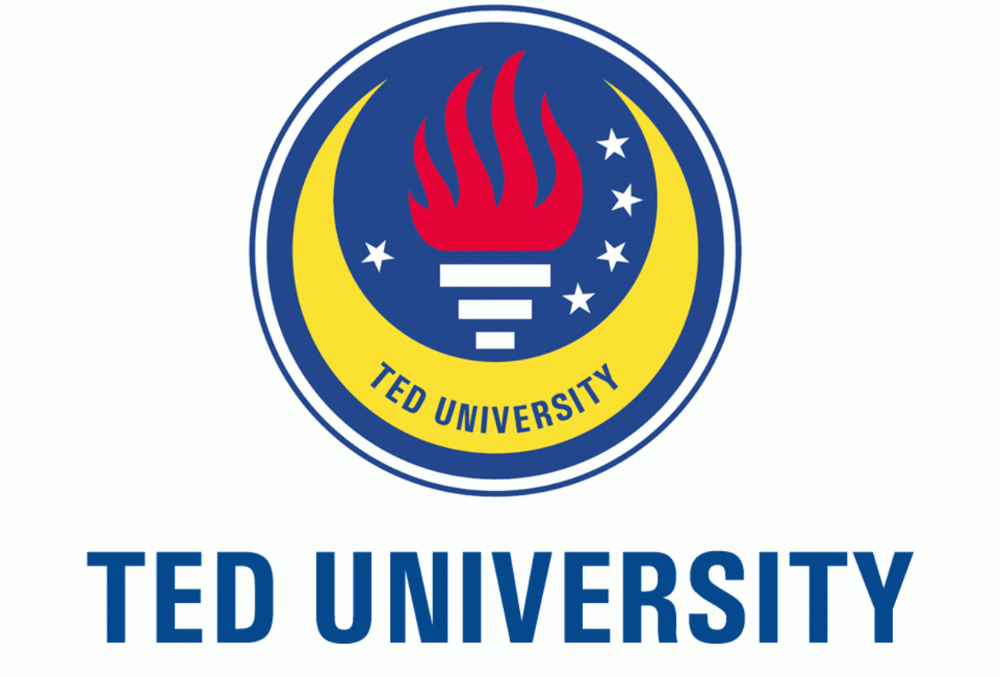

<h1><center>Author: MsC. Applied Data Science Bora BASARAN</center></h1>
<h1><center>ID: 16414425636</center></h1>
<h1><center>Lecture: ADS564 - Deep Learning</center></h1>
<h1><center>Term Project</center></h1>
<h1><center> Lecturer: Assistant Professor Doctor Safak Ozden</center></h1>

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

In [2]:
train_dir = '/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train'
val_dir = '/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/valid'

In [3]:
train_datagen = ImageDataGenerator(
    rescale=1./255,             
    rotation_range=40,          
    width_shift_range=0.2,       
    height_shift_range=0.2,      
    shear_range=0.2,             
    zoom_range=0.2,              
    horizontal_flip=True,        
    fill_mode='nearest'          
)

In [4]:
train_datagen = ImageDataGenerator(rescale=1./255)  
val_datagen = ImageDataGenerator(rescale=1./255)

In [5]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  
    batch_size=32,
    class_mode='categorical'  
)

Found 5628 images belonging to 83 classes.


In [6]:
val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'  
)


Found 586 images belonging to 83 classes.


In [7]:

model = models.Sequential()


model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))


model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))


model.add(layers.Flatten())


model.add(layers.Dense(128, activation='relu'))


model.add(layers.Dense(train_generator.num_classes, activation='softmax'))


model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


model.summary()

/Applications/anaconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 83)             │        10,707 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,179,667 (42.65 MB)

 Trainable params: 11,179,667 (42.65 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator
)

Epoch 1/10


/Applications/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


176/176 ━━━━━━━━━━━━━━━━━━━━ 114s 637ms/step - accuracy: 0.0243 - loss: 4.4283 - val_accuracy: 0.0751 - val_loss: 4.1299
Epoch 2/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 125s 706ms/step - accuracy: 0.1751 - loss: 3.6013 - val_accuracy: 0.2526 - val_loss: 3.1180
Epoch 3/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 127s 716ms/step - accuracy: 0.6104 - loss: 1.5172 - val_accuracy: 0.3652 - val_loss: 3.0385
Epoch 4/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 138s 777ms/step - accuracy: 0.8875 - loss: 0.4247 - val_accuracy: 0.3549 - val_loss: 4.1894
Epoch 5/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 136s 766ms/step - accuracy: 0.9519 - loss: 0.1664 - val_accuracy: 0.3823 - val_loss: 4.4941
Epoch 6/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 126s 713ms/step - accuracy: 0.9764 - loss: 0.0774 - val_accuracy: 0.3976 - val_loss: 4.6201
Epoch 7/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 136s 769ms/step - accuracy: 0.9852 - loss: 0.0374 - val_accuracy: 0.4027 - val_loss: 4.8665
Epoch 8/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 168s 953ms/step - accuracy: 0.9888 - loss: 0.02

In [9]:
def classify_image(img_path):
    
    img = image.load_img(img_path, target_size=(224, 224))  
    img_array = image.img_to_array(img)  
    img_array = np.expand_dims(img_array, axis=0)  
    img_array = img_array / 255.0  

    
    prediction = model.predict(img_array)

    
    predicted_class = np.argmax(prediction[0])  

    
    class_labels = list(train_generator.class_indices.keys())
    predicted_car_model = class_labels[predicted_class]

    
    plt.imshow(img)  
    plt.title(f"Predicted Car Model: {predicted_car_model}")  
    plt.axis('off')  
    plt.show()  

    print(f"The car model in the image is: {predicted_car_model}")

In [10]:
model.save('trained_car_model_midterm.h5')  # Save the trained model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


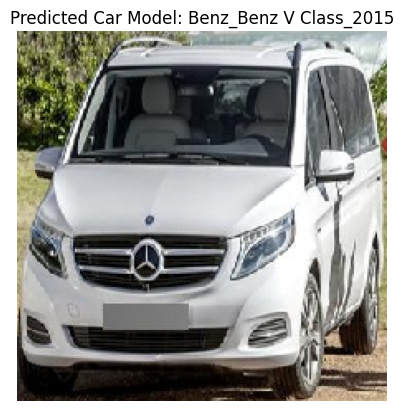

The car model in the image is: Benz_Benz V Class_2015


In [11]:
#Mercedes Benz V Class
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz V Class_2015/0659b1be880d73.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


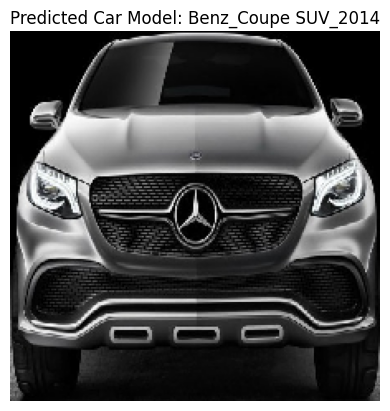

The car model in the image is: Benz_Coupe SUV_2014


In [12]:
#Mercedes Coupe SUV 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Coupe SUV_2014/2a52c748c4ec59.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


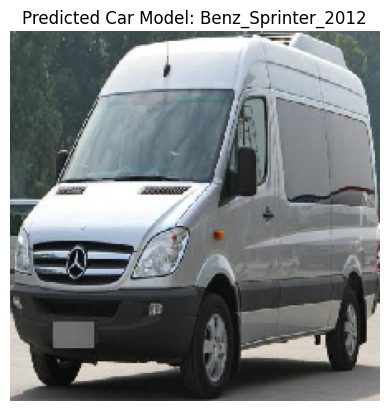

The car model in the image is: Benz_Sprinter_2012


In [13]:
#Mercedes Benz Sprinter 2012
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Sprinter_2012/83346565da1706.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


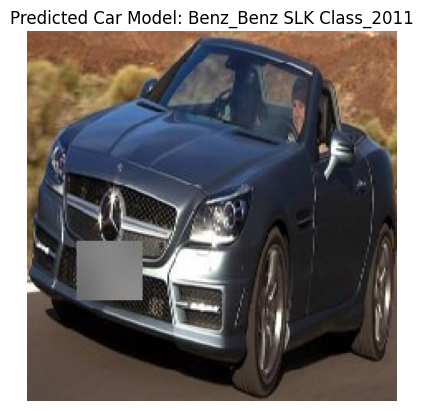

The car model in the image is: Benz_Benz SLK Class_2011


In [14]:
#Mercedes Benz SLK 2011
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz SLK Class_2011/5c703b9f113a18.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


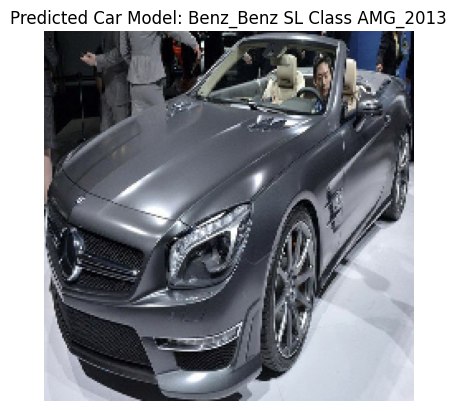

The car model in the image is: Benz_Benz SL Class AMG_2013


In [15]:
#Mercedes SL AMG 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz SL Class AMG_2013/4292329f96b178.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


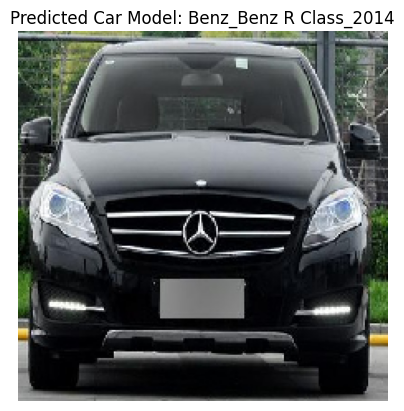

The car model in the image is: Benz_Benz R Class_2014


In [16]:
#Mercedes R 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz R Class_2014/07fb2231b6f40f.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


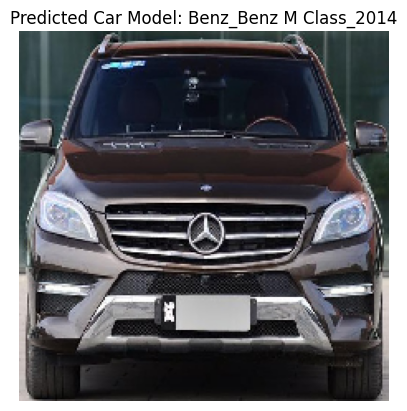

The car model in the image is: Benz_Benz M Class_2014


In [17]:
#Mercedes M 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz M Class_2014/3d642e8ec1fd30.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


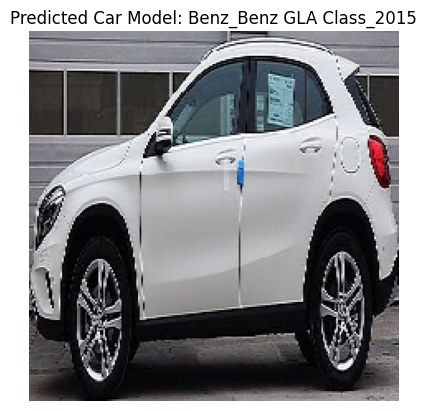

The car model in the image is: Benz_Benz GLA Class_2015


In [18]:
#Mercedes GLA 2015
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz GLA Class_2015/4bb5c41b94e2c8.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


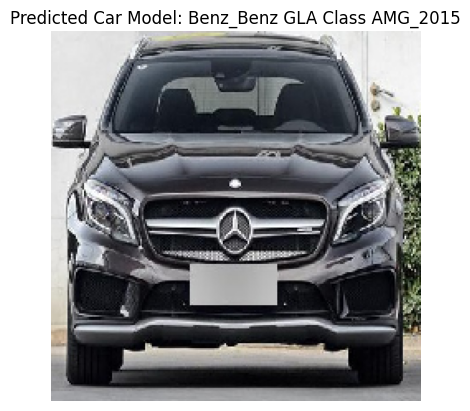

The car model in the image is: Benz_Benz GLA Class AMG_2015


In [19]:
#Mercedes GLA AMG 2015
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz GLA Class AMG_2015/2daa6701cc4451.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


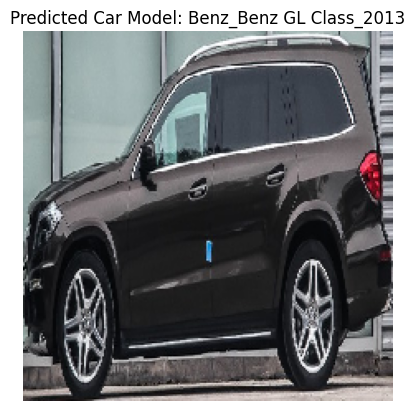

The car model in the image is: Benz_Benz GL Class_2013


In [20]:
#Mercedes GL 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz GL Class_2013/10d462377606e8.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


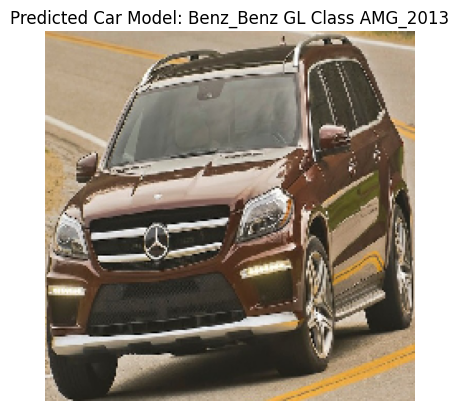

The car model in the image is: Benz_Benz GL Class AMG_2013


In [21]:
#Mercedes GL AMG 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz GL Class AMG_2013/3ff1dcd7a163a7.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


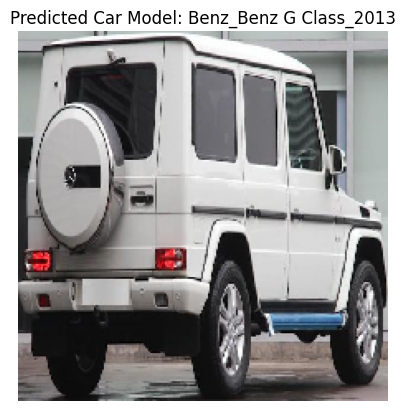

The car model in the image is: Benz_Benz G Class_2013


In [22]:
#Mercedes G 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz G Class_2013/6be697abc2b3cd.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


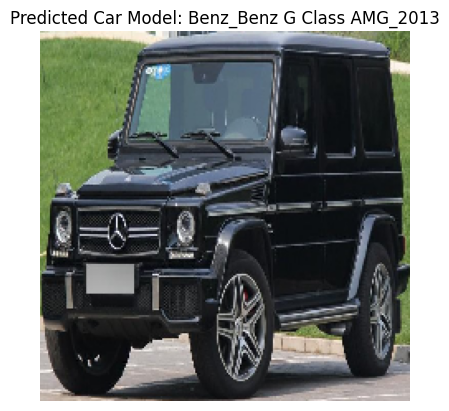

The car model in the image is: Benz_Benz G Class AMG_2013


In [23]:
#Mercedes G AMG 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz G Class AMG_2013/0f3f76af60b006.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


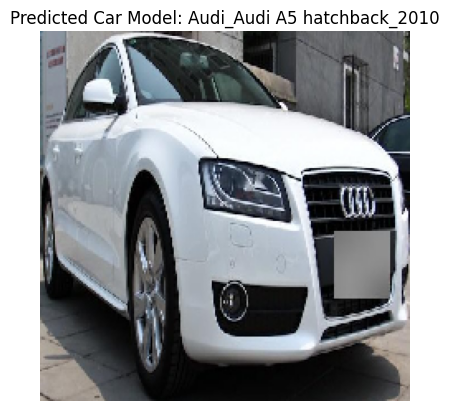

The car model in the image is: Audi_Audi A5 hatchback_2010


In [24]:
#Audi A5 Hatchback 2010
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi A5 hatchback_2010/9c4233371e3b63.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


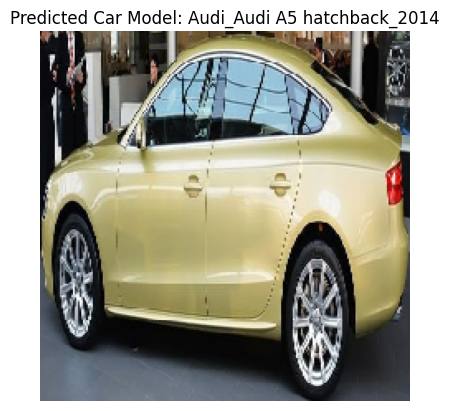

The car model in the image is: Audi_Audi A5 hatchback_2014


In [25]:
#Audi A5 Hatchback 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi A5 hatchback_2014/2e0bf4010c200f.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


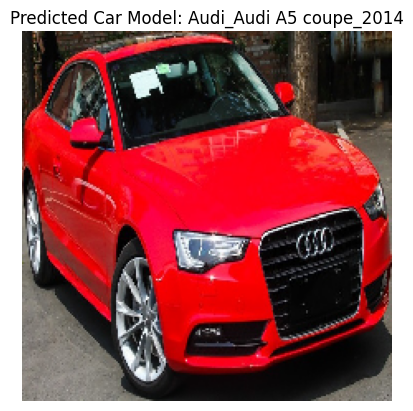

The car model in the image is: Audi_Audi A5 coupe_2014


In [26]:
#Audi A5 Coupe 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi A5 coupe_2014/8aa6a4d14c5753.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


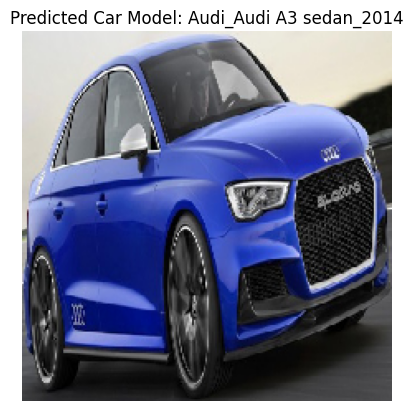

The car model in the image is: Audi_Audi A3 sedan_2014


In [27]:
#Audi A3 Sedan 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi A3 sedan_2014/7c4f55c0bae98b.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


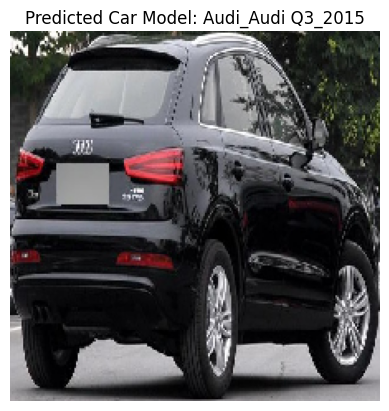

The car model in the image is: Audi_Audi Q3_2015


In [28]:
#Audi Q3 2015
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi Q3_2015/5b72353b250036.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


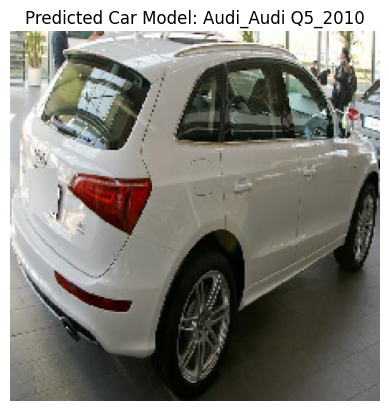

The car model in the image is: Audi_Audi Q5_2010


In [29]:
#Audi Q5 2010
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi Q5_2010/9a946db937db84.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


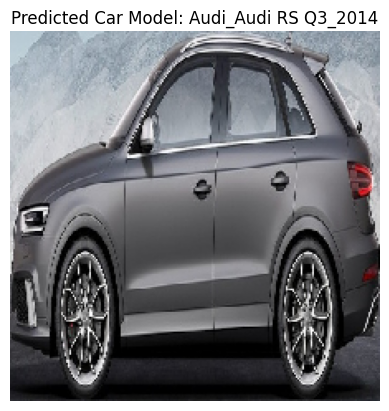

The car model in the image is: Audi_Audi RS Q3_2014


In [30]:
#Audi RS Q3 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi RS Q3_2014/5d7d63c1434e2b.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


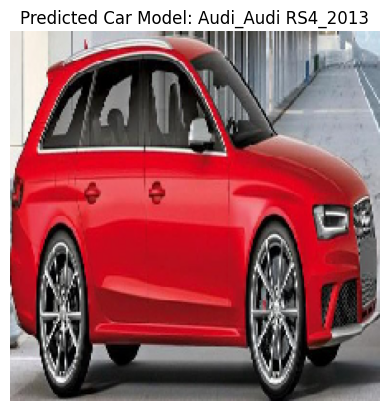

The car model in the image is: Audi_Audi RS4_2013


In [31]:
#Audi RS4 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi RS4_2013/3e75cc0963c4dc.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


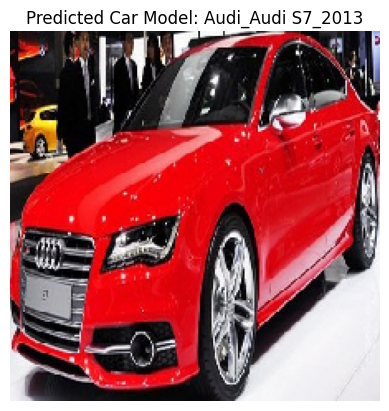

The car model in the image is: Audi_Audi S7_2013


In [32]:
#Audi S7 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi S7_2013/2e933155270937.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


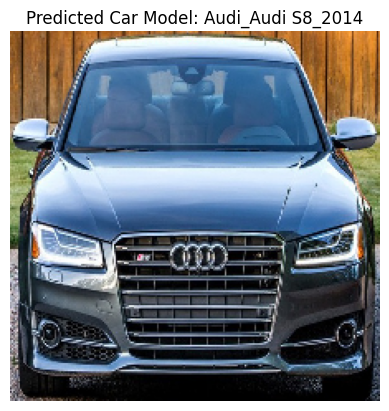

The car model in the image is: Audi_Audi S8_2014


In [33]:
#Audi S8 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi S8_2014/3d8c9c286d8c64.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


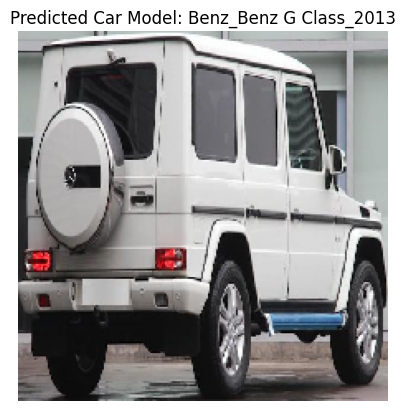

The car model in the image is: Benz_Benz G Class_2013


In [34]:
#Mercedes CLS 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz G Class_2013/6be697abc2b3cd.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


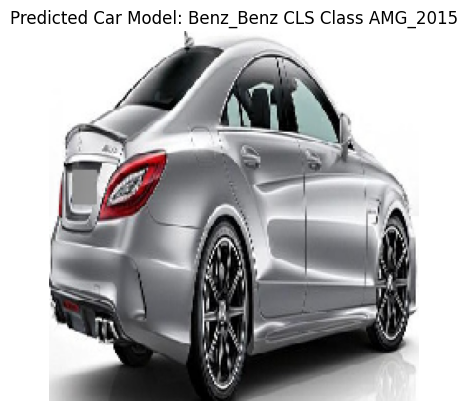

The car model in the image is: Benz_Benz CLS Class AMG_2015


In [35]:
#Mercedes C AMG 2015
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz CLS Class AMG_2015/5d26635631e9e7.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


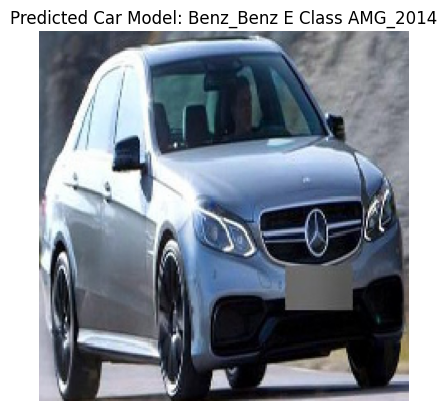

The car model in the image is: Benz_Benz E Class AMG_2014


In [36]:
#Mercedes E AMG 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz E Class AMG_2014/4c74c748afacf6.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


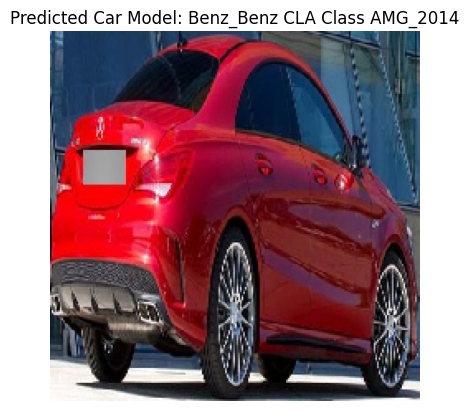

The car model in the image is: Benz_Benz CLA Class AMG_2014


In [37]:
#Mercedes CLA AMG 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz CLA Class AMG_2014/0f08155babebc0.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


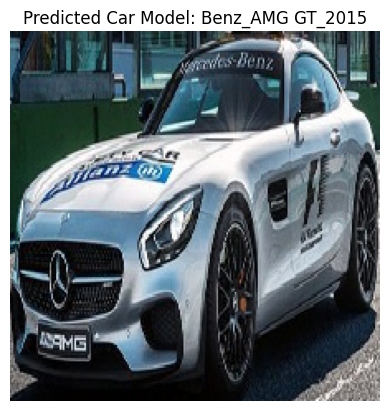

The car model in the image is: Benz_AMG GT_2015


In [38]:
#Benz AMG GT 2015
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_AMG GT_2015/0d1a35d157c6a0.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


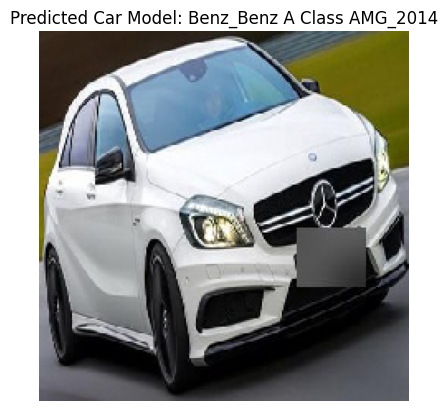

The car model in the image is: Benz_Benz A Class AMG_2014


In [39]:
#Benz A AMG 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz A Class AMG_2014/0d691a940376e1.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


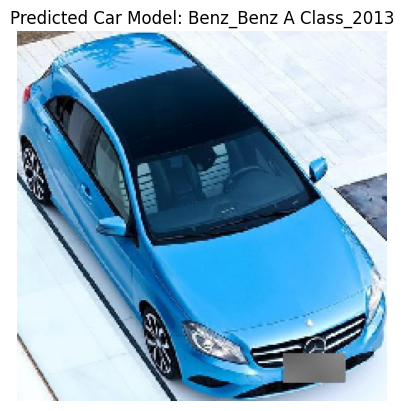

The car model in the image is: Benz_Benz A Class_2013


In [40]:
#Benz A 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Benz_Benz A Class_2013/6b9e2dec230250.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


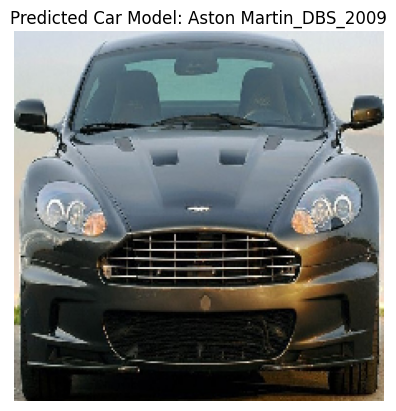

The car model in the image is: Aston Martin_DBS_2009


In [41]:
#Aston Martin DBS 2009
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Aston Martin_DBS_2009/6e3ddd7cf301da.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


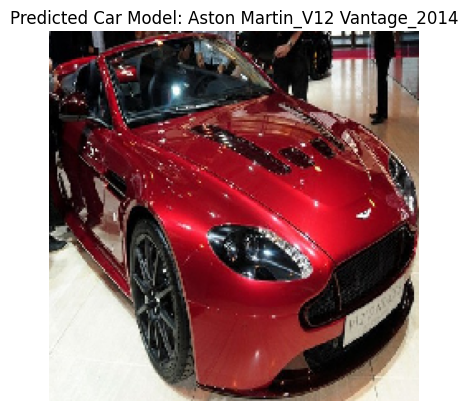

The car model in the image is: Aston Martin_V12 Vantage_2014


In [42]:
#Aston Martin V12 Vantage 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Aston Martin_V12 Vantage_2014/2f913ca279018b.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


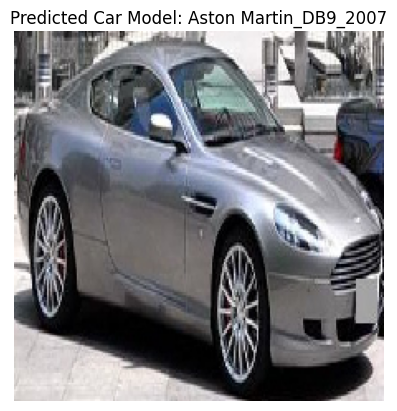

The car model in the image is: Aston Martin_DB9_2007


In [43]:
#Aston Martin DB9 2007
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Aston Martin_DB9_2007/5bb5171701275c.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


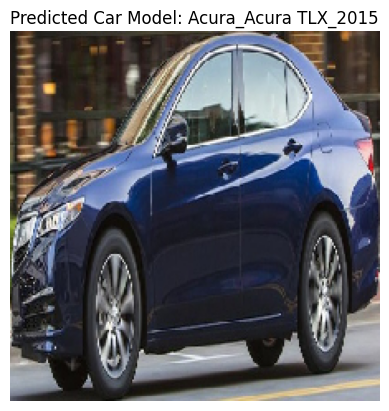

The car model in the image is: Acura_Acura TLX_2015


In [44]:
#Acura TLX 2015
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Acura_Acura TLX_2015/0e17fc42660b9e.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


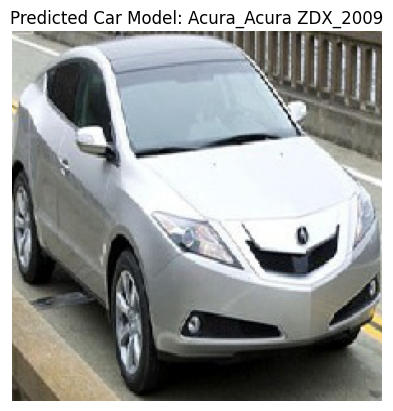

The car model in the image is: Acura_Acura ZDX_2009


In [45]:
#Acura ZDX 2009
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Acura_Acura ZDX_2009/8e12e71959f1eb.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


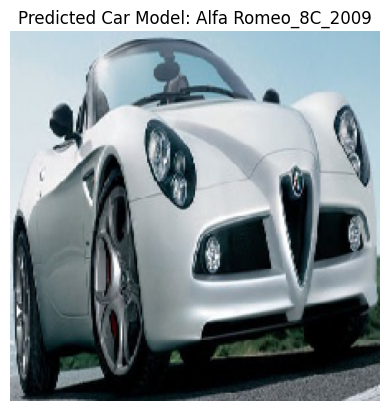

The car model in the image is: Alfa Romeo_8C_2009


In [46]:
#Alfa Romeo 8C 2009
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Alfa Romeo_8C_2009/1c2d5bfbfb06a1.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


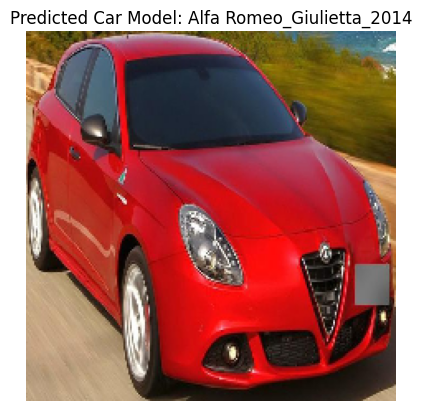

The car model in the image is: Alfa Romeo_Giulietta_2014


In [47]:
#Alfa Romeo Giulietta 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Alfa Romeo_Giulietta_2014/3db8671a9e5611.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


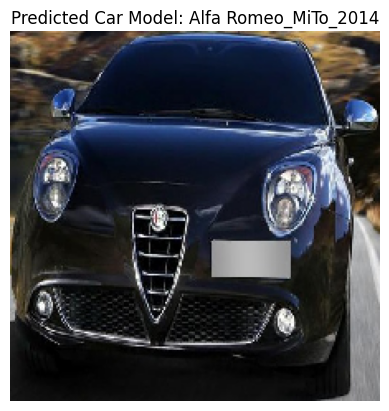

The car model in the image is: Alfa Romeo_MiTo_2014


In [48]:
#Alfa Romeo MiTo 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Alfa Romeo_MiTo_2014/1b9f31c839bb6a.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


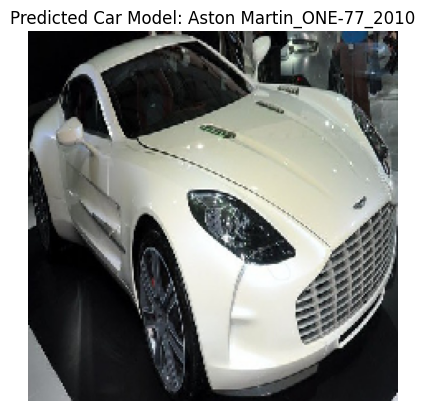

The car model in the image is: Aston Martin_ONE-77_2010


In [49]:
#Aston Martin One 77 2010
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Aston Martin_ONE-77_2010/66ea51c8c797bb.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


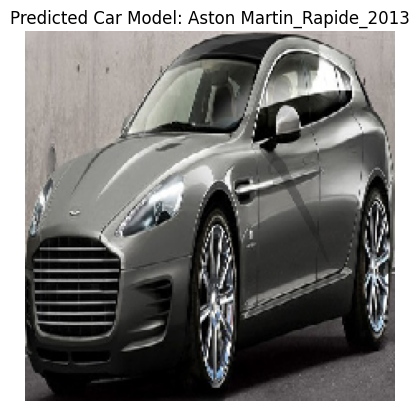

The car model in the image is: Aston Martin_Rapide_2013


In [50]:
#Aston Martin Rapide 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Aston Martin_Rapide_2013/65a113bf71f0e6.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


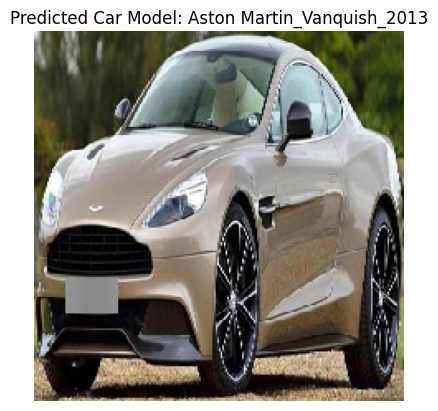

The car model in the image is: Aston Martin_Vanquish_2013


In [51]:
#Aston Martin Vanquish 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Aston Martin_Vanquish_2013/32be03c3832790.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


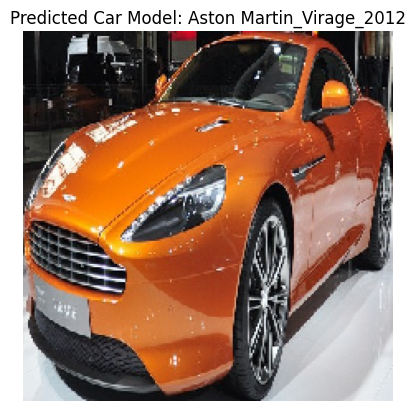

The car model in the image is: Aston Martin_Virage_2012


In [52]:
#Aston Martin Virage 2012
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Aston Martin_Virage_2012/709a7df932b431.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


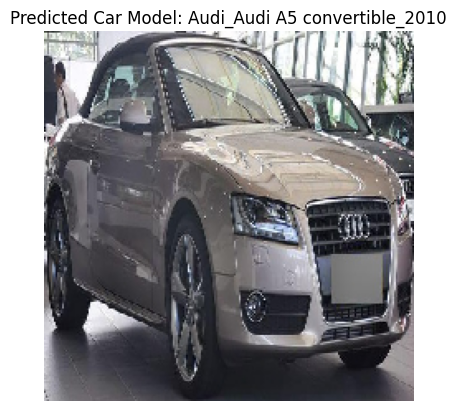

The car model in the image is: Audi_Audi A5 convertible_2010


In [53]:
#Audi A5 Convertible
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi A5 convertible_2010/84db0aa2efccda.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


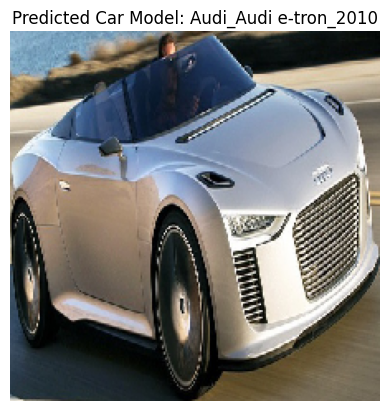

The car model in the image is: Audi_Audi e-tron_2010


In [54]:
#Audi etron 2010
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi e-tron_2010/cb07eab5af620b.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


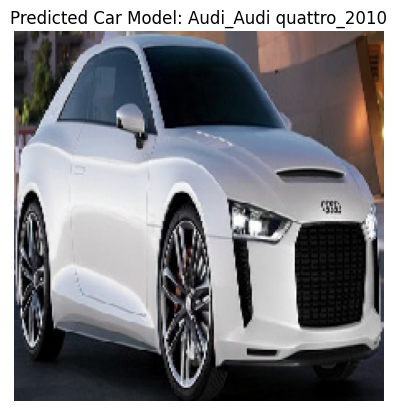

The car model in the image is: Audi_Audi quattro_2010


In [55]:
#Audi quattro 2010
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi quattro_2010/7525f653ea2b6f.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


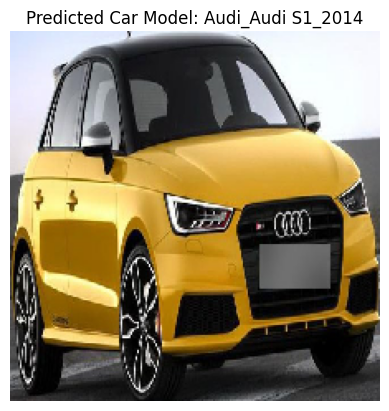

The car model in the image is: Audi_Audi S1_2014


In [56]:
#Audi S1 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi S1_2014/320edb93d62d12.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


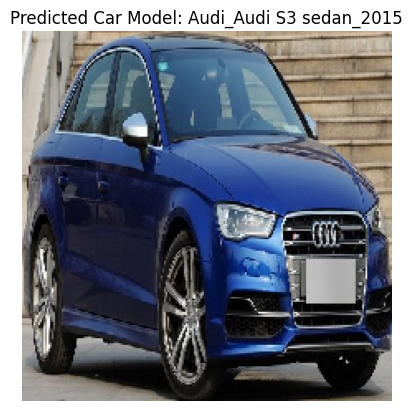

The car model in the image is: Audi_Audi S3 sedan_2015


In [57]:
#Audi S3 Sedan 2015
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi S3 sedan_2015/7e1cf254580db9.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


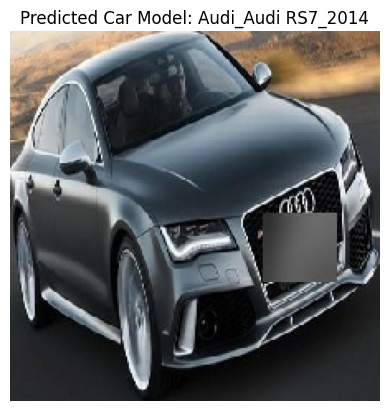

The car model in the image is: Audi_Audi RS7_2014


In [58]:
#Audi RS7 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi RS7_2014/3a72c33774b4ad.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


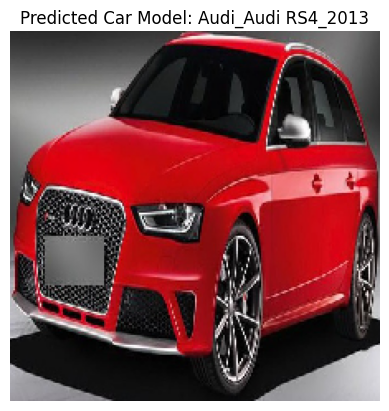

The car model in the image is: Audi_Audi RS4_2013


In [59]:
#Audi RS4 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi RS4_2013/2edb190b9edf24.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


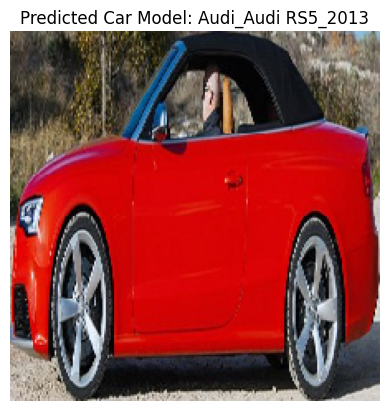

The car model in the image is: Audi_Audi RS5_2013


In [60]:
#Audi RS5 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi RS5_2013/66271186015b45.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


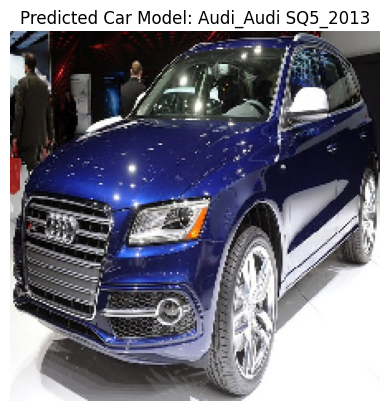

The car model in the image is: Audi_Audi SQ5_2013


In [61]:
#Audi SQ5 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Audi SQ5_2013/6d8190b42a97b6.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


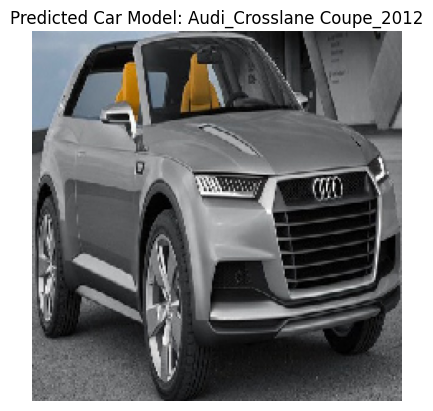

The car model in the image is: Audi_Crosslane Coupe_2012


In [62]:
#Audi Crosslane Coupe 2012
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Audi_Crosslane Coupe_2012/9c3b78bca3425c.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


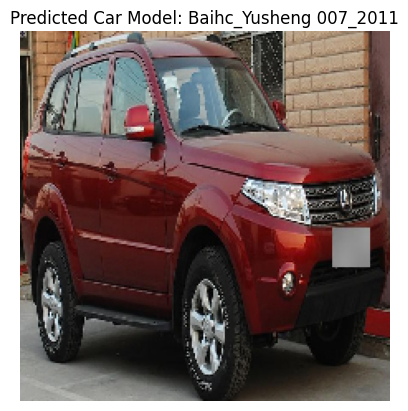

The car model in the image is: Baihc_Yusheng 007_2011


In [63]:
#Baihc Yusheng 2011
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Baihc_Yusheng 007_2011/4d720e678c5b9b.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


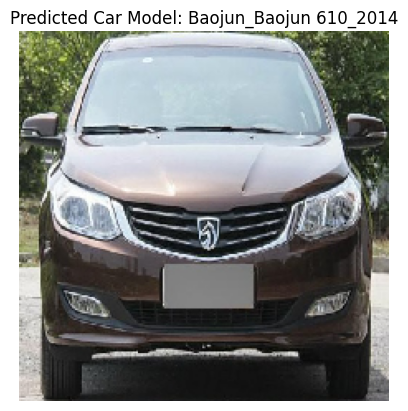

The car model in the image is: Baojun_Baojun 610_2014


In [64]:
#Baojun 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Baojun_Baojun 610_2014/4b9b9157f57d9a.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


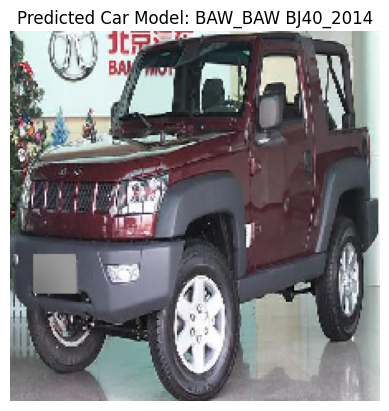

The car model in the image is: BAW_BAW BJ40_2014


In [65]:
#Baw Baw 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/BAW_BAW BJ40_2014/4bf18dfe859902.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


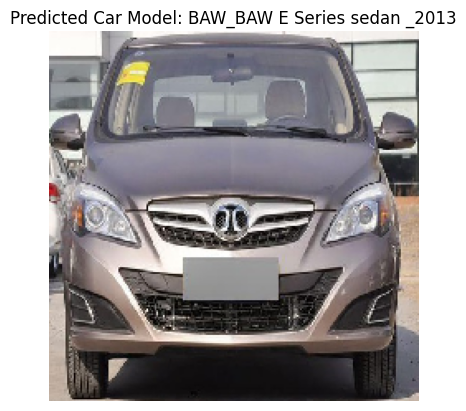

The car model in the image is: BAW_BAW E Series sedan _2013


In [66]:
#Baw Baw E Series 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/BAW_BAW E Series sedan _2013/1d13ba889ab936.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


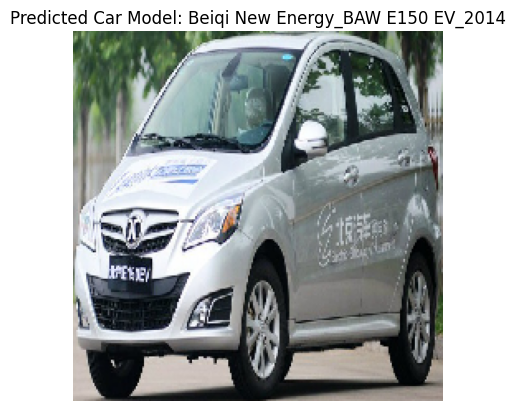

The car model in the image is: Beiqi New Energy_BAW E150 EV_2014


In [67]:
#Beiqi New Energy E150 EV_2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Beiqi New Energy_BAW E150 EV_2014/65d0950a2997c4.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


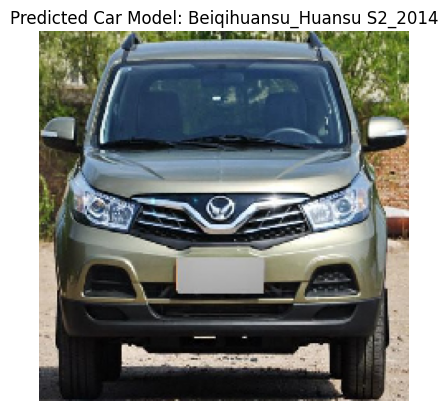

The car model in the image is: Beiqihuansu_Huansu S2_2014


In [68]:
#Beiqihuansu Huansu S2 2014
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Beiqihuansu_Huansu S2_2014/3cdd0290e479f2.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


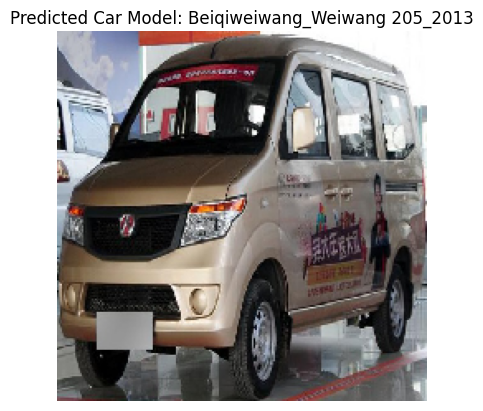

The car model in the image is: Beiqiweiwang_Weiwang 205_2013


In [69]:
#Beiqiweiwang 205 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Beiqiweiwang_Weiwang 205_2013/1d4bd163b2aea9.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


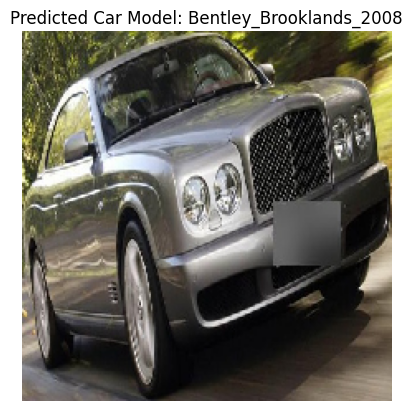

The car model in the image is: Bentley_Brooklands_2008


In [70]:
#Bentley Brooklands 2008
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Bentley_Brooklands_2008/2b07c3f50b9c5a.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


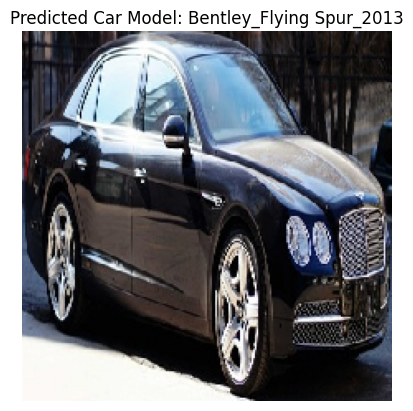

The car model in the image is: Bentley_Flying Spur_2013


In [71]:
#Bentley Flying Spur 2013
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Bentley_Flying Spur_2013/0e1fe13263ac41.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


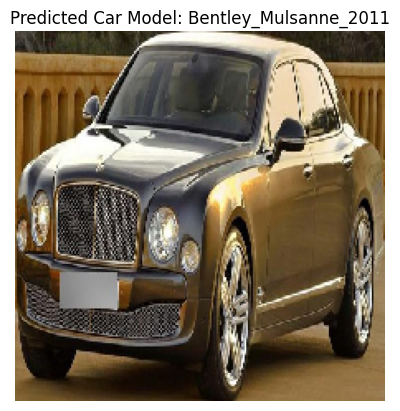

The car model in the image is: Bentley_Mulsanne_2011


In [72]:
#Bentley Mulsanne 2011
classify_image('/Users/nilbasaran/Desktop/CS566/Car Brand Classification/Dataset/CompCar/CompCar_1/compcars_maker_brand_year83/train/Bentley_Mulsanne_2011/0eee60b0bac085.jpg')

In [73]:
from tensorflow.keras.metrics import Precision, Recall
import matplotlib.pyplot as plt

# Compile the model with additional metrics
model.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy', Precision(), Recall()])

In [74]:
history = model.fit(train_generator, epochs=10, validation_data=val_generator)

Epoch 1/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 203s 1s/step - accuracy: 0.9791 - loss: 0.0580 - precision: 0.9813 - recall: 0.9774 - val_accuracy: 0.3601 - val_loss: 5.6384 - val_precision: 0.3996 - val_recall: 0.3464
Epoch 2/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - accuracy: 0.9731 - loss: 0.0712 - precision: 0.9772 - recall: 0.9718 - val_accuracy: 0.3720 - val_loss: 5.6456 - val_precision: 0.4048 - val_recall: 0.3447
Epoch 3/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 161s 911ms/step - accuracy: 0.9740 - loss: 0.0796 - precision: 0.9754 - recall: 0.9717 - val_accuracy: 0.3379 - val_loss: 6.0392 - val_precision: 0.3755 - val_recall: 0.3140
Epoch 4/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 178s 1s/step - accuracy: 0.9796 - loss: 0.0582 - precision: 0.9822 - recall: 0.9773 - val_accuracy: 0.3515 - val_loss: 5.8851 - val_precision: 0.3911 - val_recall: 0.3311
Epoch 5/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 161s 913ms/step - accuracy: 0.9756 - loss: 0.0690 - precision: 0.9781 - recall: 0.9732 - val_accuracy: 0.3669 - v

In [75]:
from tensorflow.keras.utils import plot_model
from tensorflow.keras import layers, models

In [76]:
print("Available metrics:", history.history.keys())

Available metrics: dict_keys(['accuracy', 'loss', 'precision', 'recall', 'val_accuracy', 'val_loss', 'val_precision', 'val_recall'])


In [77]:

accuracy = history.history['accuracy']
loss = history.history['loss']

precision_1 = history.history.get('precision_1', None)
recall_1 = history.history.get('recall_1', None)


if precision_1 is not None and recall_1 is not None:
    
    f1 = [2 * (p * r) / (p + r) if p + r != 0 else 0 for p, r in zip(precision_1, recall_1)]
else:
    f1 = None
    print("Precision and/or Recall metrics are not available in the training history.")


Precision and/or Recall metrics are not available in the training history.


In [78]:
# Plot the metrics
epochs = range(1, len(accuracy) + 1)

In [79]:
plt.figure(figsize=(12, 8))

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

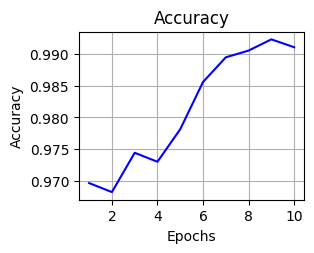

In [80]:
plt.subplot(2, 2, 1)
plt.plot(epochs, accuracy, label='Accuracy', color='b')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)

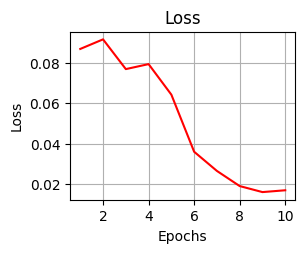

In [81]:
plt.subplot(2, 2, 2)
plt.plot(epochs, loss, label='Loss', color='r')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)

In [82]:
import matplotlib.pyplot as plt
import networkx as nx

In [83]:
def plot_cnn_architecture():
    # Create a new directed graph
    G = nx.DiGraph()

    # Add input, hidden, and output layers as nodes
    # Input Layer
    G.add_node('Input Layer\n(224x224x3)', pos=(0, 0))

    # Hidden Layers (Convolutional and MaxPooling layers)
    G.add_node('Conv Layer 1 (32 filters)', pos=(1, 2))
    G.add_node('MaxPooling Layer 1', pos=(1, 1))

    G.add_node('Conv Layer 2 (64 filters)', pos=(2, 2))
    G.add_node('MaxPooling Layer 2', pos=(2, 1))

    G.add_node('Conv Layer 3 (128 filters)', pos=(3, 2))
    G.add_node('MaxPooling Layer 3', pos=(3, 1))

    G.add_node('Flatten Layer', pos=(4, 2))
    G.add_node('Fully Connected Layer (128 units)', pos=(5, 2))

    # Output Layer
    G.add_node('Output Layer\n(Softmax)', pos=(6, 0))

    # Add edges between the nodes to represent the flow of data
    G.add_edges_from([
        ('Input Layer\n(224x224x3)', 'Conv Layer 1 (32 filters)'),
        ('Conv Layer 1 (32 filters)', 'MaxPooling Layer 1'),
        ('MaxPooling Layer 1', 'Conv Layer 2 (64 filters)'),
        ('Conv Layer 2 (64 filters)', 'MaxPooling Layer 2'),
        ('MaxPooling Layer 2', 'Conv Layer 3 (128 filters)'),
        ('Conv Layer 3 (128 filters)', 'MaxPooling Layer 3'),
        ('MaxPooling Layer 3', 'Flatten Layer'),
        ('Flatten Layer', 'Fully Connected Layer (128 units)'),
        ('Fully Connected Layer (128 units)', 'Output Layer\n(Softmax)')
    ])

    # Define node positions for visualization (input, hidden, and output layers)
    pos = nx.get_node_attributes(G, 'pos')

    # Draw the graph with adjustments
    plt.figure(figsize=(15, 10))
    nx.draw(G, pos, with_labels=True, node_size=5000, node_color='skyblue', font_size=12, font_weight='bold', arrows=True, edge_color='gray', width=2)

    # Title and show the plot
    plt.title("CNN Architecture: Input, Hidden, and Output Layers", fontsize=20)
    plt.axis('off')
    plt.show()

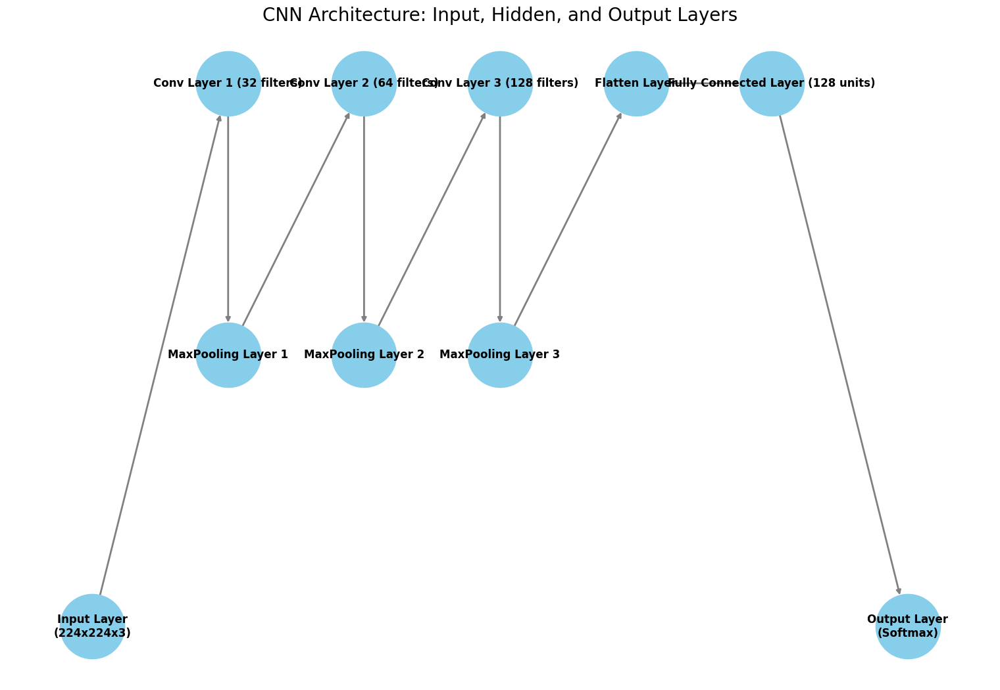

In [84]:
plot_cnn_architecture()

In [85]:
pip install gradio

  Using cached pandas-2.2.3-cp312-cp312-macosx_11_0_arm64.whl.metadata (89 kB)
Using cached pandas-2.2.3-cp312-cp312-macosx_11_0_arm64.whl (11.4 MB)
Note: you may need to restart the kernel to use updated packages.


Car Model Classification CNN - Gradio Demo 

In [86]:
import gradio as gr# Set up Gradio interface
import gradio as gr
import tensorflow as tf
from tensorflow.keras.models import load_model
from PIL import Image
import numpy as np


In [87]:
import gradio as gr
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.vgg16 import preprocess_input
import matplotlib.pyplot as plt


import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

# Define the function to classify the image
def classify_image_(image):
    # Resize the image to the required input size (match your CNN input size)
    img_resized = image.resize((224, 224))  # Use your model's input size (e.g., 224x224)

    # Convert the image to a numpy array
    img_array = np.array(img_resized)
    
    # Normalize the image (between 0 and 1) if your model was trained with such preprocessing
    img_array = img_array / 255.0
    
    # Ensure the image has 3 channels (RGB), even if grayscale images are provided
    if img_array.shape[-1] != 3:
        img_array = np.repeat(img_array[..., np.newaxis], 3, axis=-1)

    # Add an extra dimension for batch size (required for CNNs)
    img_array = np.expand_dims(img_array, axis=0)

    # Make the prediction
    prediction = model.predict(img_array)

    # Debugging: Print prediction shape and the prediction itself
    print("Prediction shape:", prediction.shape)
    print("Prediction:", prediction)

    # Get the predicted class index
    predicted_class = np.argmax(prediction[0])

    # Map the predicted class index to the actual class label (car model)
    class_indices = train_generator.class_indices  # Assuming you have the train_generator
    class_labels = {v: k for k, v in class_indices.items()}
    predicted_car_model = class_labels[predicted_class]

    # Plot the image with the predicted car model
    plt.imshow(img_resized)
    plt.title(f"Predicted Car Model: {predicted_car_model}")
    plt.axis('off')
    plt.show()

    # Return the image and prediction text
    return img_resized, f"The car model in the image is: {predicted_car_model}"






In [88]:
interface = gr.Interface(fn=classify_image_, 
                         inputs=gr.Image(type="pil"),  # Image input (Gradio will provide it as PIL)
                         outputs=[gr.Image(type="pil"), "text"],  # Image and text outputs
                         title="Car Brand Detection",
                         description="Upload an image to classify the car brand")

In [89]:
pip install tensorflow gradio numpy pillow


  Using cached pandas-2.2.3-cp312-cp312-macosx_11_0_arm64.whl.metadata (89 kB)
Using cached pandas-2.2.3-cp312-cp312-macosx_11_0_arm64.whl (11.4 MB)
Note: you may need to restart the kernel to use updated packages.


In [90]:
interface.launch()

* Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


https://medium.com/@chromogamingrs/convolutional-neural-networks-provides-state-of-art-classifications-based-on-several-sectors-such-7b063e01f7f3

In [91]:
demo = gr.Interface(fn=classify_image_, 
                         inputs=gr.Image(type="pil"),  # Image input (Gradio will provide it as PIL)
                         outputs=[gr.Image(type="pil"), "text"],  # Image and text outputs
                         title="Car Brand Detection",
                         description="Upload an image to classify the car brand")

In [92]:
demo.launch(share=True)

* Running on local URL:  http://127.0.0.1:7861
* Running on public URL: https://2d7d98740b39515918.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [93]:
demo.launch(share=True,pwa=True)

Rerunning server... use `close()` to stop if you need to change `launch()` parameters.
----
* Running on public URL: https://2d7d98740b39515918.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
Prediction shape: (1, 83)
Prediction: [[1.76043741e-07 2.34675723e-10 1.42534000e-05 2.19002132e-08
  3.11216445e-06 8.62417102e-04 6.48541434e-04 7.12740002e-05
  1.27258900e-04 2.10155977e-05 6.22369407e-05 2.32510433e-06
  3.23677305e-05 4.33424395e-03 8.38472508e-04 1.73223818e-08
  3.99881031e-07 1.25956080e-06 2.50970835e-08 1.54820664e-04
  3.28024862e-06 1.17029168e-03 1.53357473e-06 1.93046468e-09
  1.43591296e-06 5.88373972e-08 4.76689728e-08 2.40933730e-07
  1.02329777e-05 8.97381336e-10 6.56310078e-07 4.34416680e-09
  1.13313729e-06 5.44234069e-07 7.32916732e-08 2.15430282e-06
  6.14998353e-05 2.20525493e-07 1.33916046e-07 1.33128663e-06
  3.12276320e-08 1.86018710e-07 1.49224763e-06 5.11348162e-06
  3.77159377e-05 2.24616485e-07 8.90398502e-01 2.90641969e-04
  2.24035446e-07 5.83588111e-08 7.72546059e-07 5.11725943e-07
  6.41697255e-08 5.21542461e-06 7.07046297e-07 2.40732450e-03
  5.32870035e-05 3.51358437e-07 1.94918695e-08 3.842194

/var/folders/kx/8x_00_q96_1_31lr0mzfq99w0000gn/T/ipykernel_4878/2128456150.py:52: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
